In [2]:
import numpy as np
import csv
import random
from copy import deepcopy

# --- LED S-box ---
ORIGINAL_SBOX = [
    0xc, 0x5, 0x6, 0xb, 0x9, 0x0, 0xa, 0xd,
    0x3, 0xe, 0xf, 0x8, 0x4, 0x7, 0x1, 0x2
]

# --- MixColumns Matrix (defined over GF(4)) ---
MIX_COLUMNS_MATRIX = [
    [0x4, 0x1, 0x2, 0x2],
    [0x8, 0x6, 0x5, 0x6],
    [0xb, 0xe, 0xa, 0x9],
    [0x2, 0x2, 0xf, 0xb]
]

# Galois Field multiplication in GF(2^4)
GF_MOD = 0b10011

def gf_mul(a, b):
    result = 0
    for i in range(4):
        if b & 1:
            result ^= a
        carry = a & 0x8
        a <<= 1
        if carry:
            a ^= GF_MOD
        b >>= 1
    return result & 0xF

# Apply MixColumnsSerial using MDS matrix
def mix_columns_serial(state):
    result = [[0]*4 for _ in range(4)]
    for col in range(4):
        for row in range(4):
            val = 0
            for k in range(4):
                val ^= gf_mul(MIX_COLUMNS_MATRIX[row][k], state[k][col])
            result[row][col] = val
    return result

# Shift rows
def shift_rows(state):
    return [
        [state[0][0], state[0][1], state[0][2], state[0][3]],
        [state[1][1], state[1][2], state[1][3], state[1][0]],
        [state[2][2], state[2][3], state[2][0], state[2][1]],
        [state[3][3], state[3][0], state[3][1], state[3][2]],
    ]

# SubCells
def sub_cells(state, sbox):
    return [[sbox[cell] for cell in row] for row in state]

# AddConstants
def add_constants(state, round_number):
    RC = [0xc, 0x9, 0xf, 0x6, 0x3, 0x8, 0x0, 0xb,
          0x1, 0x2, 0xd, 0x4, 0xe, 0x7, 0xa, 0x5]
    rc = RC[round_number % 16]
    state[0][0] ^= 0x01
    state[1][1] ^= 0x02
    state[2][2] ^= 0x04
    state[3][3] ^= rc
    return state

# AddRoundKey (only every 4 rounds for 128-bit key)
def add_round_key(state, key_nibbles):
    key_matrix = bytes_to_matrix(key_nibbles)
    for i in range(4):
        for j in range(4):
            state[i][j] ^= key_matrix[i][j]
    return state

# Convert 16-nibble list to 4x4 state matrix
def bytes_to_matrix(b):
    return [list(b[i:i+4]) for i in range(0, 16, 4)]

# Flatten matrix to list
def matrix_to_bytes(matrix):
    return [cell for row in matrix for cell in row]

# Generate S-box variants
def get_sbox(case):
    sbox = deepcopy(ORIGINAL_SBOX)
    if case == 1:
        sbox[3] = 0xb
        sbox[0xc] = 0x4
    elif case == 2:
        sbox[3] = 0x4
    return sbox

# LED encryption (full structure for 128-bit key)
def encrypt_led(plaintext, key, sbox):
    state = bytes_to_matrix(plaintext)
    key_nibbles = [((byte & 0xF0) >> 4) for byte in key[:8]] + [byte & 0x0F for byte in key[:8]]

    for rnd in range(32):
        state = add_constants(state, rnd)
        if rnd % 4 == 0:
            state = add_round_key(state, key_nibbles)
        state = sub_cells(state, sbox)
        state = shift_rows(state)
        state = mix_columns_serial(state)
    return matrix_to_bytes(state)

# Generate ciphertext samples
def generate_samples(label, sbox, key, num_samples=2**17, output_file="samples.csv"):
    with open(output_file, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['ciphertext', 'label'])
        for _ in range(num_samples):
            plaintext = [random.getrandbits(4) for _ in range(16)]
            ciphertext = encrypt_led(plaintext, key, sbox)
            cipher_hex = ''.join(f"{b:x}" for b in ciphertext)
            writer.writerow([cipher_hex, label])

# Main
def main():
    key = [0x12, 0x34, 0x56, 0x78, 0x9a, 0xbc, 0xde, 0xf0,
           0x0f, 0xed, 0xcb, 0xa9, 0x87, 0x65, 0x43, 0x21]

    print("Generating Case 0 - Original S-box")
    generate_samples(label=0, sbox=get_sbox(0), key=key, output_file='ciphertexts_label_0.csv')

    print("Generating Case 1 - S-box with S(3)=B and S(C)=4")
    generate_samples(label=1, sbox=get_sbox(1), key=key, output_file='ciphertexts_label_1.csv')

    print("Generating Case 2 - S(3)=4")
    generate_samples(label=2, sbox=get_sbox(2), key=key, output_file='ciphertexts_label_2.csv')

    print("Data generation complete.")

if __name__ == "__main__":
    main()

Generating Case 0 - Original S-box
Generating Case 1 - S-box with S(3)=B and S(C)=4
Generating Case 2 - S(3)=4
Data generation complete.


In [4]:
import pandas as pd
import random

# Load all datasets
df0 = pd.read_csv('ciphertexts_label_0.csv')
df1 = pd.read_csv('ciphertexts_label_1.csv')
df2 = pd.read_csv('ciphertexts_label_2.csv')

# Show label-wise counts
print("Number of samples in each label:")
print(f"Label 0: {len(df0)}")
print(f"Label 1: {len(df1)}")
print(f"Label 2: {len(df2)}")
print(f"Total samples before merge: {len(df0) + len(df1) + len(df2)}\n")

# Combine all datasets
merged_df = pd.concat([df0, df1, df2], ignore_index=True)

# Shuffle the combined dataframe
merged_df = merged_df.sample(frac=1).reset_index(drop=True)

# Save to CSV
merged_df.to_csv('merged_ciphertexts.csv', index=False)
print("Merged and shuffled dataset saved to 'merged_ciphertexts.csv'\n")

# some random samples from each label
print("samples from Label 0:")
print(merged_df[merged_df['label'] == 0].sample(5))

print("\nsamples from Label 1:")
print(merged_df[merged_df['label'] == 1].sample(5))

print("\nsamples from Label 2:")
print(merged_df[merged_df['label'] == 2].sample(5))

Number of samples in each label:
Label 0: 131072
Label 1: 131072
Label 2: 131072
Total samples before merge: 393216

Merged and shuffled dataset saved to 'merged_ciphertexts.csv'

samples from Label 0:
              ciphertext  label
295010  2c74b8214dff70e7      0
361787  3a5f8122cab70cfd      0
42286   d0c742aabea7e63f      0
380058  75ecd754fb4be5e4      0
240416  91477c50dbdd3599      0

samples from Label 1:
              ciphertext  label
304666  9fbe6035a23ead3f      1
332230  7e276b4a37521f7c      1
296364  774a318f6299b7b4      1
202491  479539ce14bce7f0      1
142587  99f9d786d889093e      1

samples from Label 2:
              ciphertext  label
161766  8e8398a187b79534      2
9483    1c9c3b72987367d7      2
91072   0d68d15075c2818c      2
183451  6557068b5b825a99      2
159798  150d71795c78afe4      2


In [5]:
pip install pandas numpy scikit-learn tensorflow matplotlib

In [6]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import classification_report, confusion_matrix

# Load merged CSV
df = pd.read_csv("merged_ciphertexts.csv")

#  Convert hex to 64-bit binary vector
def hex_to_binary_list(hex_str):
    bin_str = bin(int(hex_str, 16))[2:].zfill(64)
    return [int(b) for b in bin_str]

X = np.array(df["ciphertext"].apply(hex_to_binary_list).tolist())  # Shape: (N, 64)
y = np.array(df["label"])

# Encode labels (0, 1, 2) to one-hot
lb = LabelBinarizer()
y_encoded = lb.fit_transform(y)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# ================================
#  ANN Model
# ================================
def build_ann(input_dim):
    model = tf.keras.Sequential([
        tf.keras.Input(shape=(input_dim,)),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(3, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

ann = build_ann(X_train.shape[1])

print("\nTraining ANN Model...\n")
ann.fit(X_train, y_train, validation_split=0.1, epochs=5, batch_size=256, verbose=2)

print("\nEvaluating ANN Model...")
ann_loss, ann_acc = ann.evaluate(X_test, y_test, verbose=1)
print(f"\nTest Accuracy: {ann_acc * 100:.2f}%")

# Classification report
y_pred_ann = ann.predict(X_test)
y_pred_ann_labels = np.argmax(y_pred_ann, axis=1)
y_true_labels = np.argmax(y_test, axis=1)

print("\nClassification Report for ANN:\n")
print(classification_report(y_true_labels, y_pred_ann_labels, digits=4))

# ================================
#  1D CNN Model
# ================================
X_train_cnn = X_train.reshape(-1, 64, 1)
X_test_cnn = X_test.reshape(-1, 64, 1)

def build_1d_cnn():
    model = tf.keras.Sequential([
        tf.keras.Input(shape=(64, 1)),
        tf.keras.layers.Conv1D(32, kernel_size=3, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Conv1D(64, kernel_size=3, activation='relu'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(3, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

cnn = build_1d_cnn()

print("\nTraining 1D CNN Model...\n")
cnn.fit(X_train_cnn, y_train, validation_split=0.1, epochs=5, batch_size=256, verbose=2)

print("\nEvaluating CNN Model...")
cnn_loss, cnn_acc = cnn.evaluate(X_test_cnn, y_test, verbose=1)
print(f"\nTest Accuracy: {cnn_acc * 100:.2f}%")

# Classification report
y_pred_cnn = cnn.predict(X_test_cnn)
y_pred_cnn_labels = np.argmax(y_pred_cnn, axis=1)

print("\nClassification Report for 1D CNN:\n")
print(classification_report(y_true_labels, y_pred_cnn_labels, digits=4))


Training ANN Model...

Epoch 1/5
1106/1106 - 7s - 6ms/step - accuracy: 0.3336 - loss: 1.1005 - val_accuracy: 0.3350 - val_loss: 1.0987
Epoch 2/5
1106/1106 - 4s - 4ms/step - accuracy: 0.3341 - loss: 1.0987 - val_accuracy: 0.3357 - val_loss: 1.0987
Epoch 3/5
1106/1106 - 4s - 4ms/step - accuracy: 0.3352 - loss: 1.0986 - val_accuracy: 0.3329 - val_loss: 1.0987
Epoch 4/5
1106/1106 - 6s - 5ms/step - accuracy: 0.3369 - loss: 1.0986 - val_accuracy: 0.3371 - val_loss: 1.0988
Epoch 5/5
1106/1106 - 4s - 4ms/step - accuracy: 0.3394 - loss: 1.0985 - val_accuracy: 0.3357 - val_loss: 1.0988

Evaluating ANN Model...
2458/2458 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.3334 - loss: 1.0987

Test Accuracy: 33.50%
2458/2458 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step

Classification Report for ANN:

              precision    recall  f1-score   support

           0     0.3347    0.3795    0.3557     26322
           1     0.3351    0.2371    0.2777     26119
           2     0.3352    0.3878    0.3596     2620

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [7]:
pip install seaborn

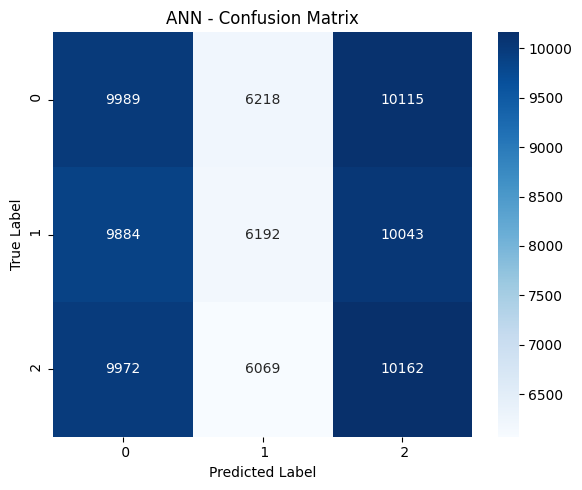

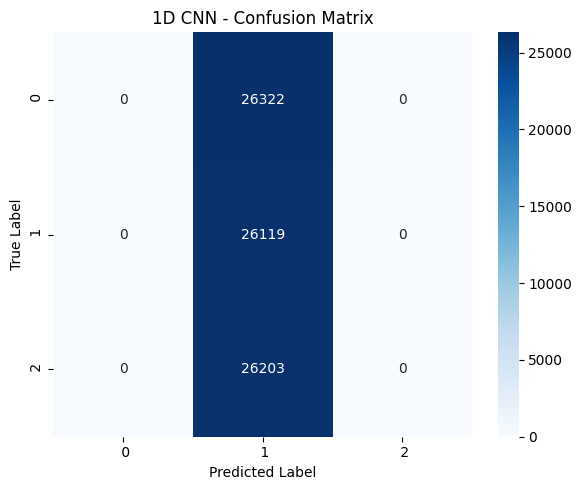

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# ==========================
#   Confusion Matrix Plot
# ==========================
def plot_confusion_matrix(true_labels, pred_labels, model_name):
    cm = confusion_matrix(true_labels, pred_labels)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f" {i}" for i in range(3)],
                yticklabels=[f" {i}" for i in range(3)])
    plt.title(f"{model_name} - Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()

#  ANN Confusion Matrix
plot_confusion_matrix(y_true_labels, y_pred_ann_labels, "ANN")

#  CNN Confusion Matrix
plot_confusion_matrix(y_true_labels, y_pred_cnn_labels, "1D CNN")


In [9]:
pip install shap


Running SHAP analysis on CNN model...
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_18
Received: inputs=['Tensor(shape=(100, 64, 1))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_18
Received: inputs=['Tensor(shape=(50, 64, 1))']
  warnings.warn(msg)


SHAP values shape: (100, 64, 1, 3)

Plotting SHAP summary dot plots for each class...
Summary plot for class 0


/tmp/ipython-input-39-272211021.py:36: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_reshaped[i], X_explain.squeeze(), feature_names=feature_names, plot_type="dot")


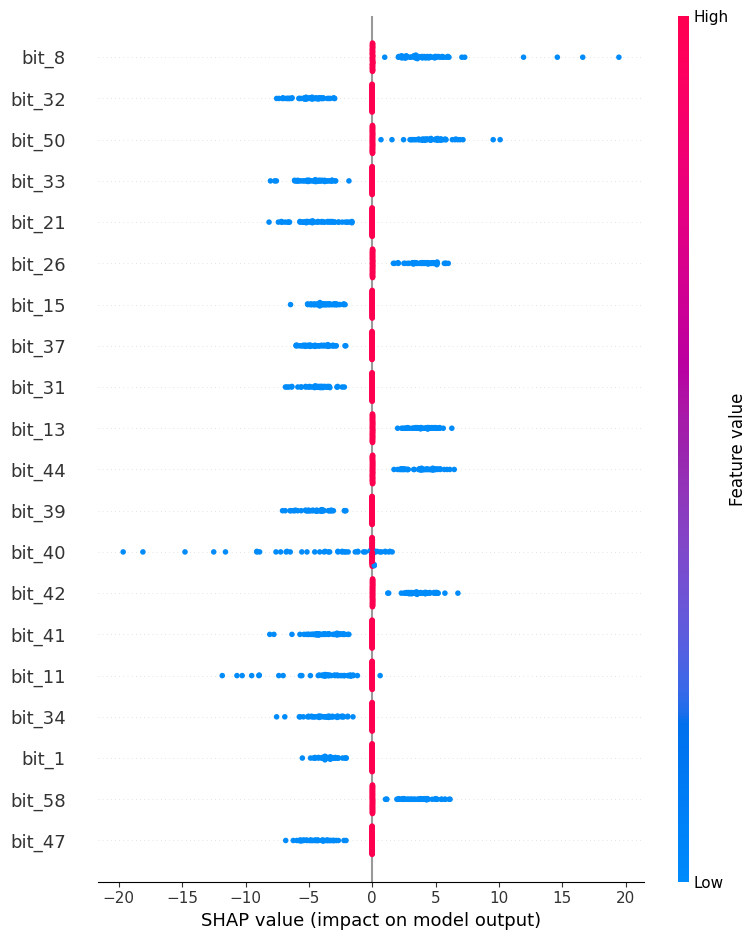

Summary plot for class 1


/tmp/ipython-input-39-272211021.py:36: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_reshaped[i], X_explain.squeeze(), feature_names=feature_names, plot_type="dot")


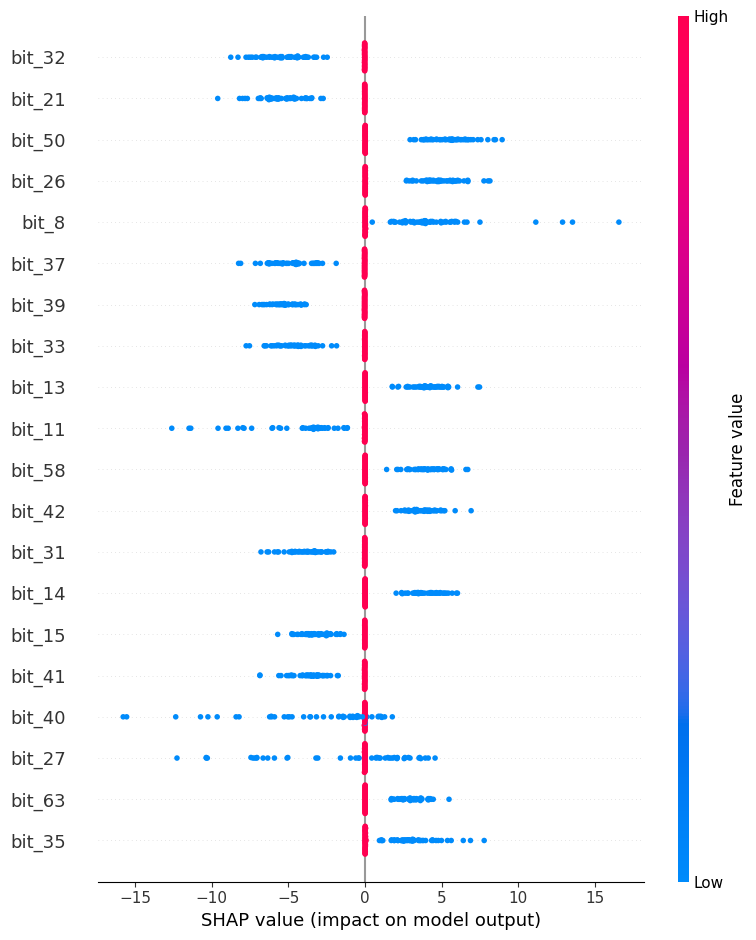

Summary plot for class 2


/tmp/ipython-input-39-272211021.py:36: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_reshaped[i], X_explain.squeeze(), feature_names=feature_names, plot_type="dot")


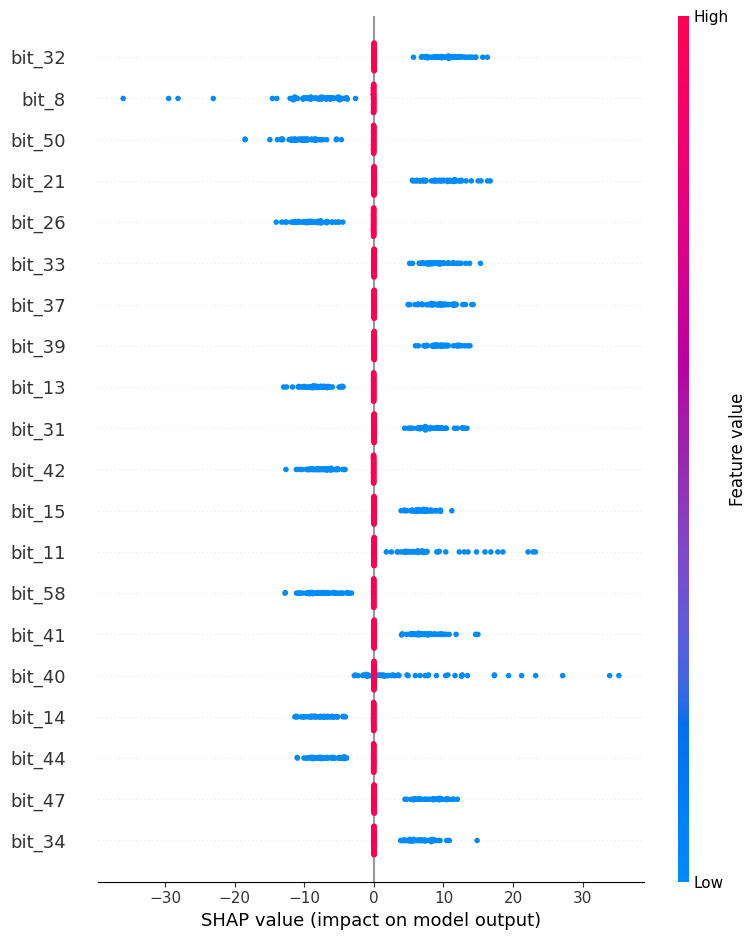

In [39]:
import shap
import matplotlib.pyplot as plt
import numpy as np

print("\nRunning SHAP analysis on CNN model...")

# Background and explanation sets
X_shap_background = X_train[:100].reshape(-1, 64, 1)
X_explain = X_test[:100].reshape(-1, 64, 1)

# Use GradientExplainer (safe for TensorFlow CNNs)
explainer = shap.GradientExplainer(cnn, X_shap_background)

# Optional: Set expected value for visualization
explainer.expected_value = np.mean(cnn.predict(X_shap_background), axis=0)

# Compute SHAP values
shap_values = explainer.shap_values(X_explain)

# Check shape (should be: list of 2D arrays per class → shape = [class][samples, features])
print(f"SHAP values shape: {np.array(shap_values).shape}")  # Should be (num_classes, 100, 64)

# Reshape the shap_values to be in the correct format for summary_plot
shap_values_reshaped = np.array(shap_values).squeeze().transpose(2, 0, 1)


# Feature names
feature_names = [f"bit_{i}" for i in range(X_explain.shape[1])]

# ============================
#  Summary Bar Plot (per class)
# ============================
print("\nPlotting SHAP summary dot plots for each class...")
for i in range(shap_values_reshaped.shape[0]):
    print(f"Summary plot for class {i}")
    shap.summary_plot(shap_values_reshaped[i], X_explain.squeeze(), feature_names=feature_names, plot_type="dot")


 Force Plot for sample 17, class 1



 Waterfall Plot for sample 17, class 1


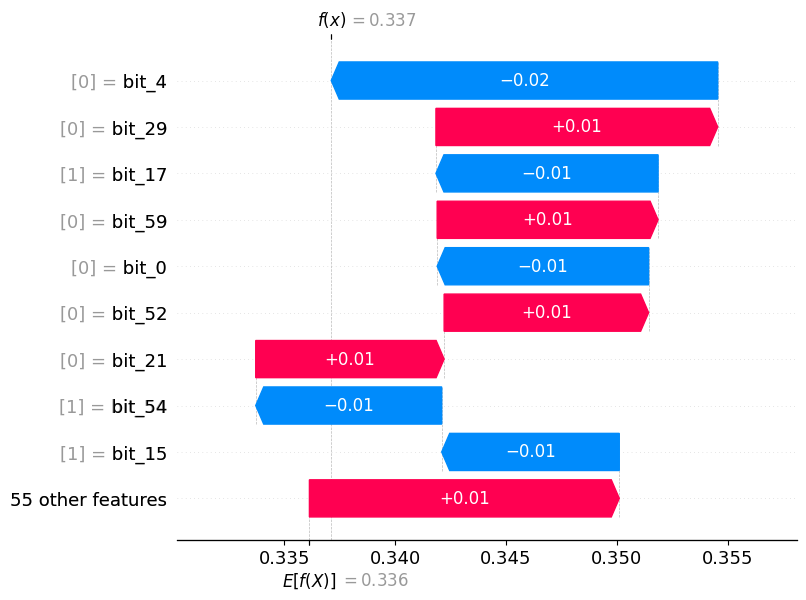

In [40]:
import shap
import numpy as np
import matplotlib.pyplot as plt

shap.initjs()

# Sample and class to explain
sample_index = 17
target_class = 1

# Ensure everything is a proper numpy array or float
shap_val = shap_values_per_class[target_class][sample_index]
shap_val = shap_val.numpy() if hasattr(shap_val, 'numpy') else shap_val

feature_val = X_explain[sample_index]
feature_val = feature_val.numpy() if hasattr(feature_val, 'numpy') else feature_val

expected_val = explainer.expected_value[target_class]
expected_val = float(expected_val)

# ========== Force Plot ==========
print(f"\n Force Plot for sample {sample_index}, class {target_class}")
force_plot = shap.force_plot(
    base_value=expected_val,
    shap_values=shap_val,
    features=feature_val,
    feature_names=feature_names
)
display(force_plot)

# ========== Waterfall Plot ==========
print(f"\n Waterfall Plot for sample {sample_index}, class {target_class}")
exp = shap.Explanation(
    values=shap_val,
    base_values=expected_val,
    data=feature_val,
    feature_names=feature_names
)
shap.plots.waterfall(exp)

In [12]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 1.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=e4b4b33635c1f1a98d82f5d1b843c4db1b85f6fa83cf7a8f7cb6620a5f6d2c2a
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step

 LIME Explanation for Class 0
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


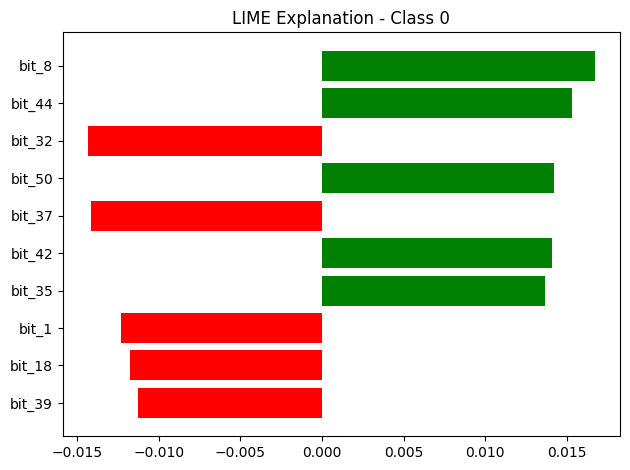


 LIME Explanation for Class 1
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


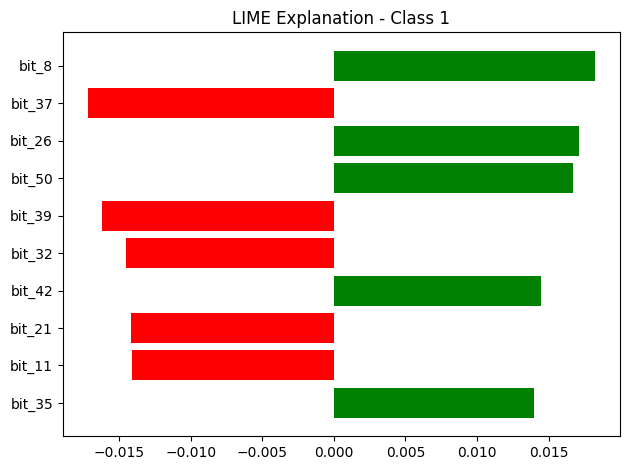


 LIME Explanation for Class 2
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


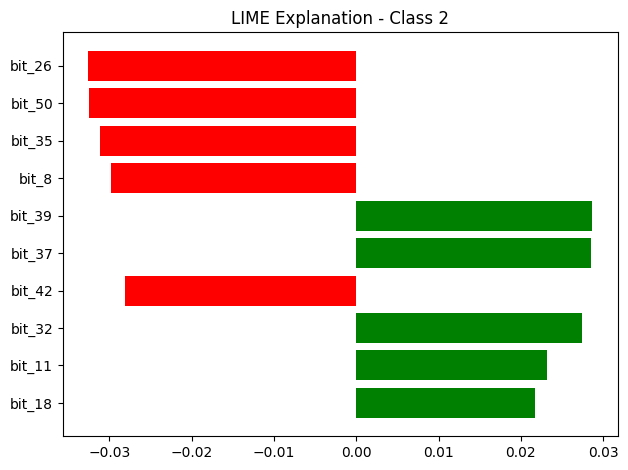

In [34]:
import lime
import lime.lime_tabular
import matplotlib.pyplot as plt

# ========== USER DEFINED VARIABLES ==========
sample_idx = 10072        # Index of test sample to explain
class_labels = [0, 1, 2]  # All classes
num_features = 10        # Number of top features to display
# ============================================

# Flattened data for LIME, but original input for model
X_train_flat = X_train.reshape(X_train.shape[0], -1)
X_test_flat = X_test.reshape(X_test.shape[0], -1)

# Define a custom prediction function that works on flat input
def lime_predict_fn(data_flat):
    data_reshaped = data_flat.reshape(-1, 64, 1)  # Reshape to match CNN input
    return cnn.predict(data_reshaped)

# Prepare sample
sample_input_flat = X_test_flat[sample_idx]
true_label = np.argmax(y_test[sample_idx])
pred_probs = lime_predict_fn(sample_input_flat.reshape(1, -1))
pred_label = np.argmax(pred_probs)

# LIME Explainer setup
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train_flat,
    feature_names=[f"bit_{i}" for i in range(X_train_flat.shape[1])],
    class_names=["Class 0", "Class 1", "Class 2"],
    mode='classification',
    discretize_continuous=False
)

# Explain and plot separately for each class
for target_class in class_labels:
    print(f"\n LIME Explanation for Class {target_class}")
    exp = explainer.explain_instance(
        data_row=sample_input_flat,
        predict_fn=lime_predict_fn,
        labels=(target_class,),
        num_features=num_features
    )
    exp.show_in_notebook(show_table=True, show_all=False)
    exp.as_pyplot_figure(label=target_class)
    plt.title(f"LIME Explanation - Class {target_class}")
    plt.tight_layout()
    plt.show()

In [15]:
import numpy as np
import pandas as pd
from tqdm import tqdm

# ========== PRESENT Cipher Specification ==========

NUM_ROUNDS = 31

# Original PRESENT S-box
SBOX_ORIG = [
    0xC, 0x5, 0x6, 0xB,
    0x9, 0x0, 0xA, 0xD,
    0x3, 0xE, 0xF, 0x8,
    0x4, 0x7, 0x1, 0x2
]

# Bit permutation layer
PBOX = [
    0,16,32,48, 1,17,33,49,
    2,18,34,50, 3,19,35,51,
    4,20,36,52, 5,21,37,53,
    6,22,38,54, 7,23,39,55,
    8,24,40,56, 9,25,41,57,
    10,26,42,58,11,27,43,59,
    12,28,44,60,13,29,45,61,
    14,30,46,62,15,31,47,63
]

# ========== Cipher Functions ==========

def sbox_layer(state: int, sbox: list) -> int:
    out = 0
    for i in range(16):
        nibble = (state >> (i * 4)) & 0xF
        out |= sbox[nibble] << (i * 4)
    return out

def pbox_layer(state: int) -> int:
    out = 0
    for i in range(64):
        bit = (state >> i) & 1
        out |= bit << PBOX[i]
    return out

def generate_round_keys(master_key: int, sbox: list) -> list:
    keys = []
    key = master_key
    for i in range(1, NUM_ROUNDS + 1):
        keys.append((key >> 16) & 0xFFFFFFFFFFFFFFFF)
        # Rotate left 61 bits
        key = ((key << 61) | (key >> 19)) & ((1 << 80) - 1)
        # Apply S-box to the leftmost 4 bits
        sbox_val = sbox[(key >> 76) & 0xF]
        key = (key & ~(0xF << 76)) | (sbox_val << 76)
        # XOR round counter with bits 19..15
        key ^= (i & 0x1F) << 15
    return keys

def present_encrypt(plaintext: int, round_keys: list, sbox: list) -> int:
    state = plaintext
    for i in range(NUM_ROUNDS - 1):
        state ^= round_keys[i]
        state = sbox_layer(state, sbox)
        state = pbox_layer(state)
    state ^= round_keys[-1]  # Final round key (no S-box or P-box)
    return state

# ========== Dataset Generator ==========

def generate_dataset(sbox_variant: list, label: int, num_samples: int, fixed_key: int):
    data = []
    round_keys = generate_round_keys(fixed_key, sbox_variant)

    for _ in tqdm(range(num_samples), desc=f"Generating label {label}"):
        plaintext = int.from_bytes(np.random.bytes(8), byteorder='big')
        ciphertext = present_encrypt(plaintext, round_keys, sbox_variant)
        data.append((f"{ciphertext:016X}", label))

    return data

# ========== S-box Variants ==========

# Variant 0 — Original
sbox_0 = SBOX_ORIG.copy()

# Variant 1 — Swap S(3)=0xB and S(12)=0x4 → B <-> 4
sbox_1 = SBOX_ORIG.copy()
sbox_1[3], sbox_1[12] = sbox_1[12], sbox_1[3]

# Variant 2 — Replace S(3)=0xB with 0x4 (Only change one entry)
sbox_2 = SBOX_ORIG.copy()
sbox_2[3] = 0x4

# ========== Run and Save Dataset ==========

if __name__ == "__main__":
    NUM_SAMPLES = 2**15  # Reduce for testing; increase to 2**17 if needed
    FIXED_KEY = 0x0123456789ABCDEF0123  # 80-bit key

    dataset = []
    dataset += generate_dataset(sbox_0, label=0, num_samples=NUM_SAMPLES, fixed_key=FIXED_KEY)
    dataset += generate_dataset(sbox_1, label=1, num_samples=NUM_SAMPLES, fixed_key=FIXED_KEY)
    dataset += generate_dataset(sbox_2, label=2, num_samples=NUM_SAMPLES, fixed_key=FIXED_KEY)

    df = pd.DataFrame(dataset, columns=["ciphertext", "label"])
    df.to_csv("ciphertexts.csv", index=False)

    print("\n Dataset generation complete. File saved as 'ciphertexts.csv'")

Generating label 2: 100%|██████████| 32768/32768 [00:17<00:00, 1896.51it/s]



 Dataset generation complete. File saved as 'ciphertexts.csv'


In [18]:
import pandas as pd

# Load dataset
df = pd.read_csv("ciphertexts.csv")

# Show 5 random samples from each label (0, 1, 2)
for label in [0, 1, 2]:
    print(f"\n Random samples for Label {label}:")
    display(df[df['label'] == label].sample(5, random_state=42))


 Random samples for Label 0:


,ciphertext,label
1588,DF726394B8586DF3,0
2153,312081932DAE7125,0
17361,9A9B1682B3015C72,0
12922,672496FD6A9C5A7C,0
20838,86D77426A358B49C,0



 Random samples for Label 1:


,ciphertext,label
34356,A05E95EEDC3F626A,1
34921,ACFF8D3B6E84B0C3,1
50129,1119F019177C59BE,1
45690,E1F61E2B7258D54B,1
53606,5297176A6A047778,1



 Random samples for Label 2:


,ciphertext,label
67124,AA6E0A55FC5E187C,2
67689,F6B4B78BE6D29812,2
82897,066C2E3E2FE01E58,2
78458,E5C528780842013A,2
86374,4E493F15D6A3171F,2


In [19]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

# Load the dataset
df = pd.read_csv("ciphertexts.csv")

# Convert hexadecimal ciphertexts to 64-bit binary vectors
def hex_to_bin_array(hex_str):
    return np.array(list(bin(int(hex_str, 16))[2:].zfill(64))).astype(np.uint8)

X = np.array([hex_to_bin_array(x) for x in df["ciphertext"]])
y = df["label"].values.reshape(-1, 1)

# One-hot encode labels
encoder = OneHotEncoder(sparse_output=False)
y_encoded = encoder.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

print("Sample X shape:", X_train.shape)
print("Sample y shape:", y_train.shape)

Sample X shape: (78643, 64)
Sample y shape: (78643, 3)


In [20]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Build ANN
ann = Sequential([
    Dense(128, activation='relu', input_shape=(64,)),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(3, activation='softmax')
])

ann.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
ann.summary()

# Train
print("\n🔧 Training ANN...")
ann.fit(X_train, y_train, epochs=10, batch_size=256, validation_split=0.1, verbose=2)

loss, acc = ann.evaluate(X_test, y_test, verbose=0)
print(f"\n ANN Test Accuracy: {acc*100:.2f}%")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,771 (65.51 KB)

 Trainable params: 16,771 (65.51 KB)

 Non-trainable params: 0 (0.00 B)


🔧 Training ANN...
Epoch 1/10
277/277 - 2s - 9ms/step - accuracy: 0.4395 - loss: 1.0349 - val_accuracy: 0.4687 - val_loss: 0.9817
Epoch 2/10
277/277 - 1s - 4ms/step - accuracy: 0.4699 - loss: 0.9897 - val_accuracy: 0.4796 - val_loss: 0.9754
Epoch 3/10
277/277 - 2s - 6ms/step - accuracy: 0.4762 - loss: 0.9823 - val_accuracy: 0.4833 - val_loss: 0.9710
Epoch 4/10
277/277 - 1s - 5ms/step - accuracy: 0.4799 - loss: 0.9761 - val_accuracy: 0.4816 - val_loss: 0.9683
Epoch 5/10
277/277 - 2s - 8ms/step - accuracy: 0.4861 - loss: 0.9700 - val_accuracy: 0.4904 - val_loss: 0.9640
Epoch 6/10
277/277 - 1s - 4ms/step - accuracy: 0.4870 - loss: 0.9628 - val_accuracy: 0.4914 - val_loss: 0.9590
Epoch 7/10
277/277 - 1s - 4ms/step - accuracy: 0.4929 - loss: 0.9554 - val_accuracy: 0.4992 - val_loss: 0.9533
Epoch 8/10
277/277 - 1s - 4ms/step - accuracy: 0.4971 - loss: 0.9481 - val_accuracy: 0.4942 - val_loss: 0.9477
Epoch 9/10
277/277 - 1s - 4ms/step - accuracy: 0.5019 - loss: 0.9412 - val_accuracy: 0.4997 -

615/615 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
 ANN Classification Report:
              precision    recall  f1-score   support

           0     0.4282    0.4046    0.4161      6560
           1     0.4385    0.2989    0.3555      6627
           2     0.5696    0.7870    0.6609      6474

    accuracy                         0.4949     19661
   macro avg     0.4788    0.4968    0.4775     19661
weighted avg     0.4782    0.4949    0.4763     19661



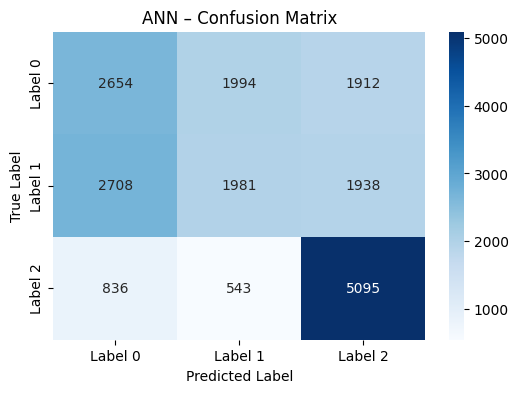

In [21]:
# Predict
y_pred_ann = ann.predict(X_test)
y_pred_classes_ann = np.argmax(y_pred_ann, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

# Classification Report
print(" ANN Classification Report:")
print(classification_report(y_true_classes, y_pred_classes_ann, digits=4))

# Confusion Matrix
cm_ann = confusion_matrix(y_true_classes, y_pred_classes_ann)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_ann, annot=True, fmt='d', cmap='Blues', xticklabels=['Label 0', 'Label 1', 'Label 2'], yticklabels=['Label 0', 'Label 1', 'Label 2'])
plt.title("ANN – Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [22]:
# Reshape for CNN
X_train_cnn = X_train.reshape(-1, 64, 1)
X_test_cnn = X_test.reshape(-1, 64, 1)

# Build 1D CNN
cnn = Sequential([
    tf.keras.layers.Conv1D(32, kernel_size=3, activation='relu', input_shape=(64,1)),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Conv1D(64, kernel_size=3, activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(3, activation='softmax')
])

cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
cnn.summary()

# Train
print("\n Training 1D CNN...")
cnn.fit(X_train_cnn, y_train, epochs=10, batch_size=256, validation_split=0.1, verbose=2)

loss, acc = cnn.evaluate(X_test_cnn, y_test, verbose=0)
print(f"\n 1D CNN Test Accuracy: {acc*100:.2f}%")

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 62, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 62, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 60, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 3840)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │       245,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,355 (985.76 KB)

 Trainable params: 252,355 (985.76 KB)

 Non-trainable params: 0 (0.00 B)


 Training 1D CNN...
Epoch 1/10
277/277 - 12s - 44ms/step - accuracy: 0.4568 - loss: 1.0038 - val_accuracy: 0.4659 - val_loss: 0.9809
Epoch 2/10
277/277 - 19s - 68ms/step - accuracy: 0.4766 - loss: 0.9831 - val_accuracy: 0.4633 - val_loss: 0.9794
Epoch 3/10
277/277 - 10s - 37ms/step - accuracy: 0.4781 - loss: 0.9797 - val_accuracy: 0.4707 - val_loss: 0.9786
Epoch 4/10
277/277 - 21s - 74ms/step - accuracy: 0.4792 - loss: 0.9772 - val_accuracy: 0.4715 - val_loss: 0.9791
Epoch 5/10
277/277 - 10s - 38ms/step - accuracy: 0.4809 - loss: 0.9747 - val_accuracy: 0.4748 - val_loss: 0.9766
Epoch 6/10
277/277 - 20s - 73ms/step - accuracy: 0.4877 - loss: 0.9703 - val_accuracy: 0.4741 - val_loss: 0.9723
Epoch 7/10
277/277 - 21s - 76ms/step - accuracy: 0.4908 - loss: 0.9645 - val_accuracy: 0.4707 - val_loss: 0.9698
Epoch 8/10
277/277 - 10s - 37ms/step - accuracy: 0.4970 - loss: 0.9605 - val_accuracy: 0.4835 - val_loss: 0.9620
Epoch 9/10
277/277 - 10s - 38ms/step - accuracy: 0.4981 - loss: 0.9544 - va

615/615 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
 CNN Classification Report:
              precision    recall  f1-score   support

           0     0.4231    0.4125    0.4177      6560
           1     0.4301    0.3267    0.3713      6627
           2     0.5792    0.7363    0.6484      6474

    accuracy                         0.4902     19661
   macro avg     0.4774    0.4918    0.4791     19661
weighted avg     0.4768    0.4902    0.4780     19661



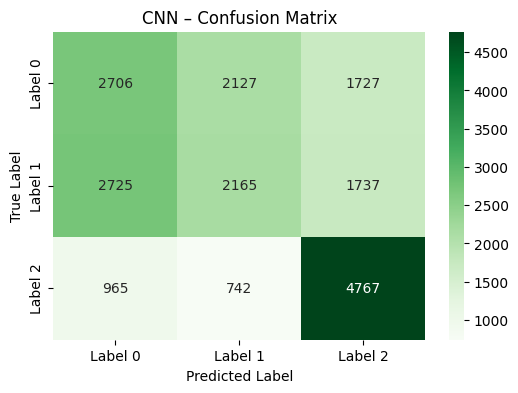

In [23]:
# Predict
y_pred_cnn = cnn.predict(X_test_cnn)
y_pred_classes_cnn = np.argmax(y_pred_cnn, axis=1)

# Classification Report
print(" CNN Classification Report:")
print(classification_report(y_true_classes, y_pred_classes_cnn, digits=4))

# Confusion Matrix
cm_cnn = confusion_matrix(y_true_classes, y_pred_classes_cnn)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Greens', xticklabels=['Label 0', 'Label 1', 'Label 2'], yticklabels=['Label 0', 'Label 1', 'Label 2'])
plt.title("CNN – Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


 Sample Index: 10072
 True Class: 2
 Input Binary (first 64 bits):
[1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 1 1 1 0 0 0 1 1 0 1 1 0 0 0 1 1 1 1 1 1 1 0
 0 1 0 0 1 1 0 0 0 0 1 1 1 0 1 0 0 0 0 0 1 0 0 0 0 1 1]

 LIME Explanation for Class 0
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


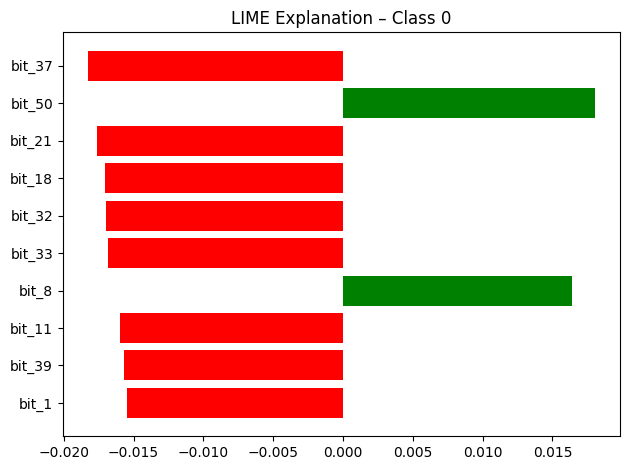

 LIME Explanation for Class 1
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


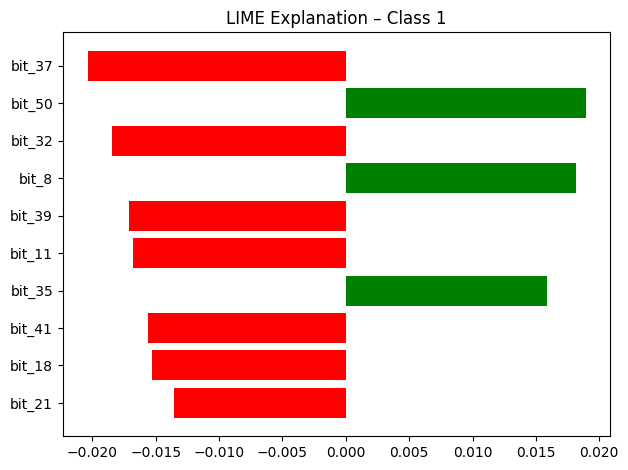

 LIME Explanation for Class 2
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


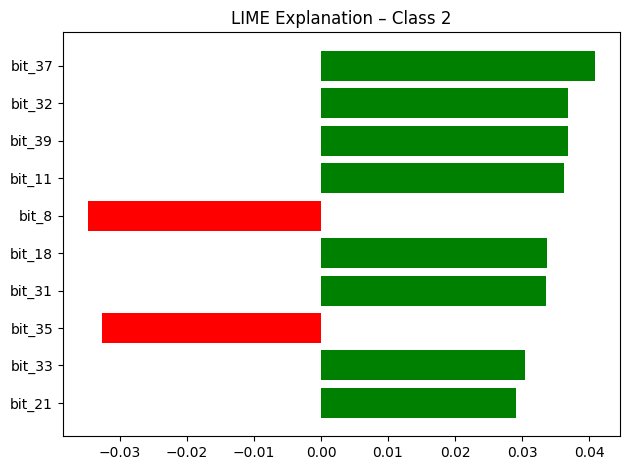

In [24]:
# ==========================
# USER-DEFINED VARIABLES
# ==========================
sample_idx = 10072         # Index of test sample to explain
num_features = 10        # Number of top features to show in LIME plot
class_names = ['Label 0', 'Label 1', 'Label 2']
# ==========================

# Flattened test input & labels
X_test_flat = X_test
y_true = np.argmax(y_test, axis=1)

# Define prediction function for LIME
def ann_predict_fn(x):
    return ann.predict(x)

# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=[f'bit_{i}' for i in range(X_train.shape[1])],
    class_names=class_names,
    mode='classification',
    discretize_continuous=False
)

# Explain the sample for all 3 classes
sample = X_test_flat[sample_idx]

print(f"\n Sample Index: {sample_idx}")
print(f" True Class: {y_true[sample_idx]}")
print(f" Input Binary (first 64 bits):\n{sample.astype(int)}\n")

for class_id in range(3):
    print(f" LIME Explanation for Class {class_id}")
    explanation = explainer.explain_instance(
        data_row=sample,
        predict_fn=ann_predict_fn,
        num_features=num_features,
        labels=[class_id]
    )

    explanation.show_in_notebook(show_table=True, show_all=False)
    fig = explanation.as_pyplot_figure(label=class_id)
    plt.title(f"LIME Explanation – Class {class_id}")
    plt.tight_layout()
    plt.show()

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_12
Received: inputs=['Tensor(shape=(100, 64))']
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_12
Received: inputs=['Tensor(shape=(50, 64))']
  warnings.warn(msg)


Original SHAP values shape for summary: (100, 64, 3)
SHAP summary plot:


/tmp/ipython-input-32-1320666645.py:23: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values_summary, X_explain_summary, feature_names=feature_names, plot_type='bar', show=True)


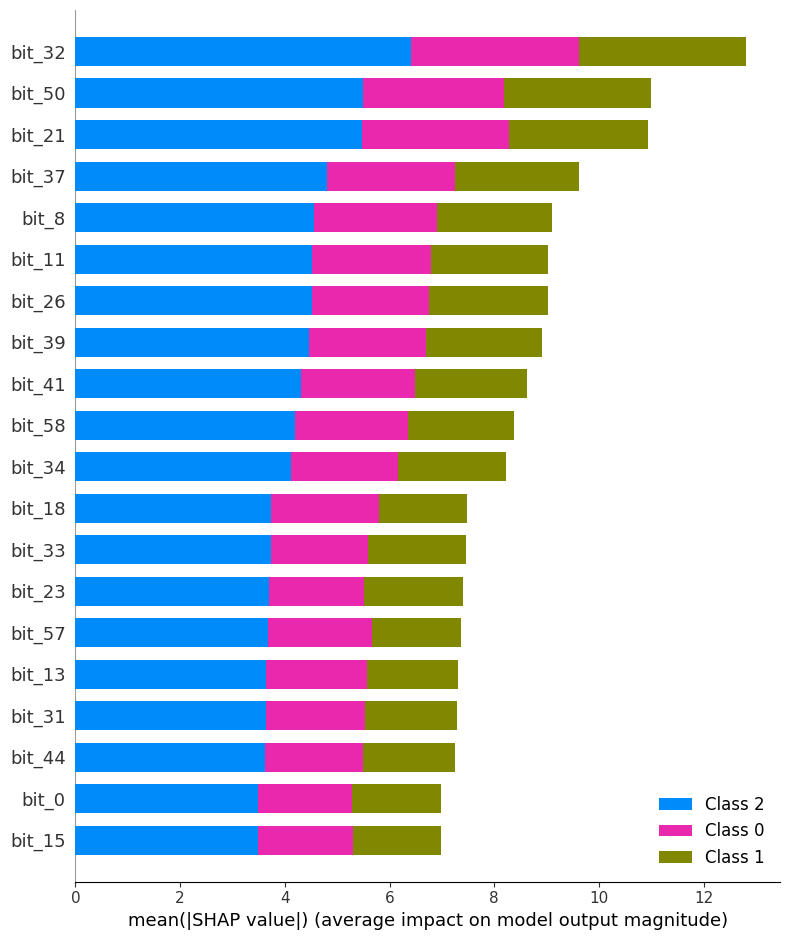

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: keras_tensor_12
Received: inputs=['Tensor(shape=(1, 64))']
  warnings.warn(msg)


In [32]:
import shap
import matplotlib.pyplot as plt
import numpy as np

# Create a SHAP explainer for the ANN model
# We use GradientExplainer as an alternative for neural network models.
# A background dataset is needed to compute the expected values.
X_background = X_train[:100]  # Using a subset of the training data for background
explainer = shap.GradientExplainer(ann, X_background)
explainer.expected_value = np.mean(ann.predict(X_background), axis=0)

# Select a set of samples to explain for the summary plot
X_explain_summary = X_test[:100]

# Get SHAP values for the summary
shap_values_summary = explainer.shap_values(X_explain_summary)

print(f"Original SHAP values shape for summary: {np.array(shap_values_summary).shape}")

feature_names = [f'bit_{i}' for i in range(64)]

print(f"SHAP summary plot:")
shap.summary_plot(shap_values_summary, X_explain_summary, feature_names=feature_names, plot_type='bar', show=True)

# Now, for the force plot of a single instance
X_explain_force = X_test[:1]
shap_values_force = explainer.shap_values(X_explain_force)
class_idx = 0
class_shap_values_force = shap_values_force[class_idx]